In [1]:
import warnings
warnings.filterwarnings(action='ignore')
%config Computer.use_jedi = False
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'NanumGothicCoding'
plt.rcParams['font.size'] = 15
import seaborn as sns
from plotnine import *
import missingno as msno

영업 중인 전국 상가 업소 동향  
공공데이터포털(https://www.data.go.kr/)에서 '소상공인시장진흥공단' 검색

<img src='./images/소상공인시장진흥공단1.png' align="left" width="1100"/>

<img src='./images/소상공인시장진흥공단2.png' align="left" width="1100"/>

소상공인시장진흥공단_상가(상권)정보 중에서 서울과 부산 데이터만 읽어서 하나의 데이터프레임으로 만들어 csv 파일로 만들어 저장한다.

In [2]:
# shop_2022_seoul = pd.read_csv('./data/shop_2022_seoul.csv')
# print(shop_2022_seoul.shape)
# shop_2022_seoul.head()

In [3]:
# shop_2022_busan = pd.read_csv('./data/shop_2022_busan.csv')
# print(shop_2022_busan.shape)
# shop_2022_busan.head()

In [4]:
# shop_2022 = pd.concat([shop_2022_seoul, shop_2022_busan], axis=0, ignore_index=True)
# shop_2022

In [5]:
# 서울과 부산 데이터만 읽어서 하나의 데이터프레임으로 만든 데이터를 csv 파일로 저장한다.
# csv 파일로 저장할 때 인덱스를 제외하고 저장하려면 index=None 옵션을 사용한다.
# shop_2022.to_csv('./data/shop_2022.csv', index=None)

In [6]:
# 파이썬은 java 처럼 {} 블록이 없어서 사용한 변수가 자동으로 삭제되지 않기때문에 계속 메모리를 차지하는 문제가 발생될 수 있으므로
# del 명령을 실행해서 사용하지 않는 변수는 메모리에서 삭제한다.
# del shop_2022_seoul, shop_2022_busan

서울과 부산 데이터만 읽어서 하나의 데이터프레임으로 만들어 저장한 csv 파일을 읽어들인다.

In [7]:
shop_2022 = pd.read_csv('./data/shop_2022.csv')
shop_2022

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,23324279,제중건강원,NaN,D,소매,D10,건강/미용식품,D10A07,건강원,G47216,...,1156010600100410002034626,NaN,서울특별시 영등포구 영중로14길 11-17,150035,7250.0,NaN,1,NaN,126.907168,37.520613
1,24525909,민속악기사,NaN,D,소매,D04,취미/오락관련소매,D04A09,악기판매,G47593,...,1120012200101420011000227,NaN,서울특별시 성동구 용답5길 2,133849,4803.0,NaN,NaN,NaN,127.049018,37.566857
2,24715368,태평양진주,NaN,D,소매,D26,시계/귀금속소매,D26A01,시계/귀금속,G47830,...,1111015200100440000000001,금사랑투빌딩,서울특별시 종로구 서순라길 17-10,110390,3138.0,NaN,NaN,NaN,126.993530,37.571848
3,15554136,김선희꼼꼼국어교습소,NaN,R,학문/교육,R01,학원-보습교습입시,R01A01,학원-입시,P85501,...,1171011100101970003017195,NaN,서울특별시 송파구 위례성대로12길 31,138834,5640.0,NaN,2,NaN,127.121520,37.510967
4,17174175,비지트,NaN,Q,음식,Q01,한식,Q01A01,한식/백반/한정식,I56111,...,1165010100108540018009586,상랑의빌딩,서울특별시 서초구 동광로18길 82,137837,6572.0,NaN,1,NaN,126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
540279,19076189,리오마죠레,NaN,F,생활서비스,F01,이/미용/건강,F01A01,여성미용실,S96112,...,2635010300116320000000001,아시아선수촌프레스센터상가,부산광역시 해운대구 반여로 131,612061,48037.0,NaN,1,NaN,129.123373,35.203476
540280,19076390,메이미래쉬,NaN,F,생활서비스,F01,이/미용/건강,F01A03,비만/피부관리,NaN,...,2644011400111900002000002,NaN,부산광역시 강서구 과학산단로334번다길 60,618210,46743.0,NaN,1,NaN,128.835928,35.149797
540281,19077180,크라운호프,부산학장점,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,2653010700201450017006118,NaN,부산광역시 사상구 대동로 111,617846,47050.0,NaN,3,NaN,128.979739,35.139354
540282,19077185,가배원커피,당리점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,2638010300106230017000001,NaN,부산광역시 사하구 낙동대로 413,604848,49410.0,101,1,NaN,128.973045,35.103424


분석 작업에 불필요한 컬럼을 삭제한다.

In [8]:
shop_2022.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [9]:
# drop() 메소드로 불필요한 컬럼을 삭제한다. => 원본 데이터가 손상된다.
# drop() 메소드는 axis=0이 기본값이므로 axis를 생략하면 행 방향 데이터를 제거하려 하기 때문에 에러가 발생되므로
# axis 옵션 값을 1로 지정해서 컬럼을 삭제한다.
# shop_2022 = shop_2022.drop('층정보') # 에러
# shop_2022 = shop_2022.drop('층정보', axis=1)
# 1개의 컬럼을 삭제하려면 삭제할 컬럼의 이름만 쓰면 되지만 2개 이상의 컬럼을 제거하려면 삭제할 컬럼을 리스트로 묶는다.
# shop_2022.drop(['동정보', '호정보'], axis=1, inplace=True)
# shop_2022.columns

분석 작업에 필요한 컬럼만 추려낸다.

In [10]:
shop_2022.isnull().sum()

상가업소번호            0
상호명               1
지점명          453162
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드      38031
표준산업분류명       38031
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             0
지번부번지        104558
지번주소              0
도로명코드             0
도로명               0
건물본번지             0
건물부번지        465928
건물관리번호            0
건물명          283713
도로명주소             0
구우편번호             0
신우편번호            49
동정보          472691
층정보          238045
호정보          540284
경도                0
위도                0
dtype: int64

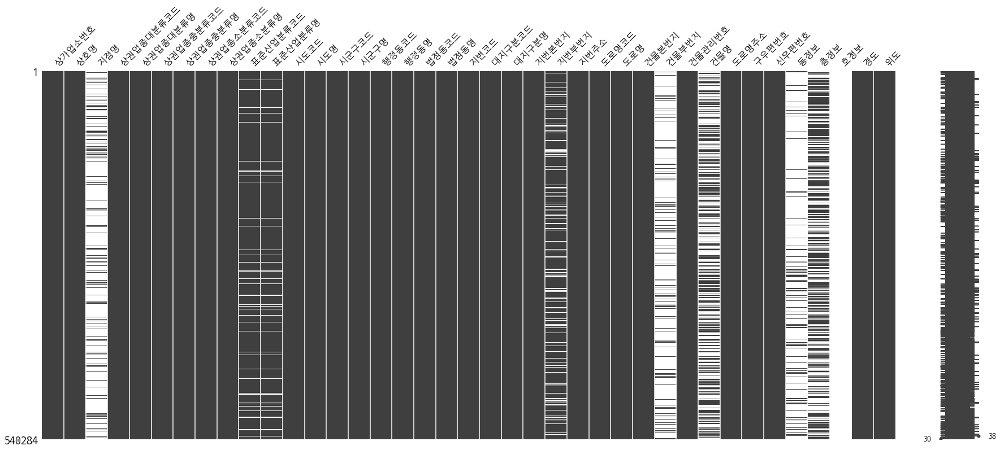

In [11]:
msno.matrix(shop_2022, figsize=(30, 12))
plt.show()

In [12]:
value_colunms = ['상호명', '지점명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명', '시도명', '시군구명', 
                 '행정동명', '법정동명', '지번주소', '도로명주소', '경도', '위도']
shop_202212 = shop_2022[value_colunms]
shop_202212

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,서울특별시 영등포구 영중로14길 11-17,126.907168,37.520613
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,서울특별시 성동구 용답5길 2,127.049018,37.566857
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,서울특별시 종로구 서순라길 17-10,126.993530,37.571848
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,서울특별시 송파구 위례성대로12길 31,127.121520,37.510967
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,서울특별시 서초구 동광로18길 82,126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...
540279,리오마죠레,NaN,생활서비스,이/미용/건강,여성미용실,부산광역시,해운대구,반여1동,반여동,부산광역시 해운대구 반여동 1632,부산광역시 해운대구 반여로 131,129.123373,35.203476
540280,메이미래쉬,NaN,생활서비스,이/미용/건강,비만/피부관리,부산광역시,강서구,녹산동,지사동,부산광역시 강서구 지사동 1190-2,부산광역시 강서구 과학산단로334번다길 60,128.835928,35.149797
540281,크라운호프,부산학장점,음식,유흥주점,호프/맥주,부산광역시,사상구,학장동,학장동,부산광역시 사상구 학장동 579-25,부산광역시 사상구 대동로 111,128.979739,35.139354
540282,가배원커피,당리점,음식,커피점/카페,커피전문점/카페/다방,부산광역시,사하구,하단1동,하단동,부산광역시 사하구 하단동 623-17,부산광역시 사하구 낙동대로 413,128.973045,35.103424


In [13]:
del shop_2022

In [14]:
shop_202212.isnull().sum()

상호명              1
지점명         453162
상권업종대분류명         0
상권업종중분류명         0
상권업종소분류명         0
시도명              0
시군구명             0
행정동명             0
법정동명             0
지번주소             0
도로명주소            0
경도               0
위도               0
dtype: int64

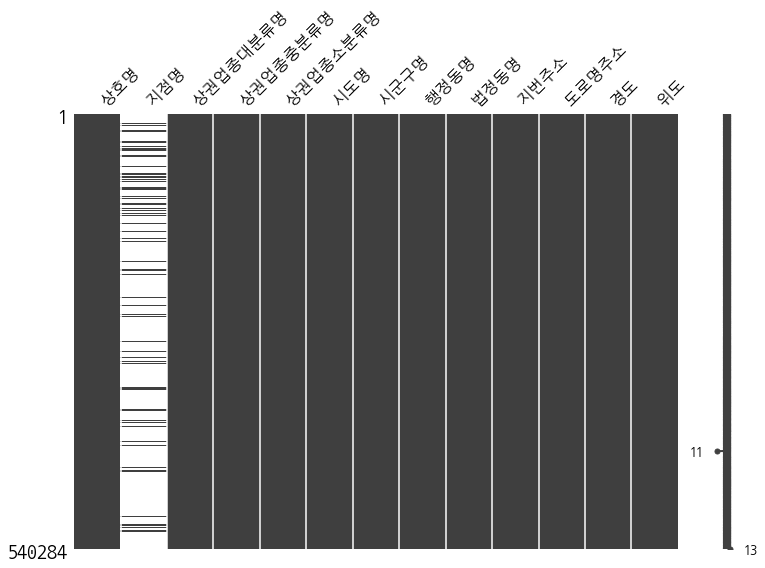

In [15]:
msno.matrix(shop_202212, figsize=(12, 8))
plt.show()

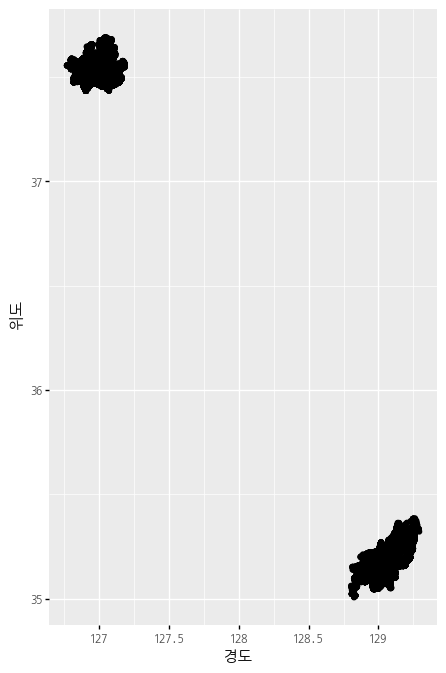

<ggplot: (114489372564)>

In [16]:
(
    ggplot(shop_202212, aes(x='경도', y='위도'))
        + geom_point()
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(5, 8))
)

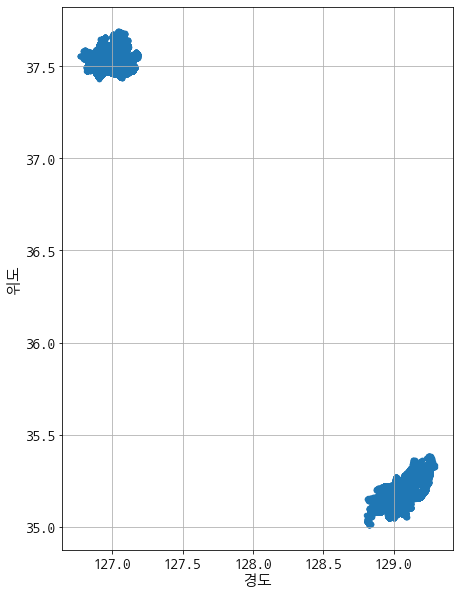

In [17]:
shop_202212.plot.scatter(x='경도', y='위도', figsize=(7, 10), grid=True)
plt.show()

데이터프레임에서 서울 데이터만 추출한다.

In [18]:
# 시도명 열에 '서울특별시'라고만 입력이 되어있다면 아래와 같이 실행하면 된다.
# shop_202212[shop_202212['시도명'] == '서울특별시']
# shop_202212.loc[shop_202212['시도명'] == '서울특별시']

# 시도명 열에 '서울특별시', '서울', '서울시'와 같이 입력값이 혼재되어 있다면 아래와 같이 논리 연산을 실행해야 한다.
# 판다스에서 불린 인뎅싱시 and 조건은 '&'를 사용하고 or 조건은 '|'를 사용한다.
# and, or 조건 지정시 관계 연산자가 사용된(브로드캐스팅이 실행되는) 부분을 반드시 ()로 묶어야 한다.
# shop_202212[(shop_202212['시도명'] == '서울특별시') | (shop_202212['시도명'] == '서울') | (shop_202212['시도명'] == '서울시')]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값의 앞 2글자가 '서울'인 데이터를 얻어온다.
# shop_202212[shop_202212.시도명.str[:2] == '서울']
# shop_202212[shop_202212.지번주소.str[:2] == '서울']
# shop_202212[shop_202212.도로명주소.str[:2] == '서울']
# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값에 '서울'이 포함된 데이터를 얻어온다.
# shop_202212[shop_202212.시도명.str.find('서울') >= 0]
# shop_202212[shop_202212.시도명.str.count('서울') >= 1]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값이 '서울'로 시작하는 데이터를 얻어온다.
# startswith() 메소드는 인수로 지정된 문자열로 시작하면 True, 그렇치 않으면 False를 리턴한다.
# endswith() 메소드는 인수로 지정된 문자열로 끝나면 True, 그렇치 않으면 False를 리턴한다.
shop_seoul = shop_202212[shop_202212.시도명.str.startswith('서울')]
shop_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,서울특별시 영등포구 영중로14길 11-17,126.907168,37.520613
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,서울특별시 성동구 용답5길 2,127.049018,37.566857
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,서울특별시 종로구 서순라길 17-10,126.993530,37.571848
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,서울특별시 송파구 위례성대로12길 31,127.121520,37.510967
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,서울특별시 서초구 동광로18길 82,126.991394,37.488375
...,...,...,...,...,...,...,...,...,...,...,...,...,...
377719,향나무참숯장어나라,NaN,음식,한식,한식/백반/한정식,서울특별시,은평구,대조동,대조동,서울특별시 은평구 대조동 26-8,서울특별시 은평구 진흥로 153-4,126.926643,37.609327
377720,에이치에스컨설팅,NaN,부동산,부동산중개,부동산중개,서울특별시,도봉구,방학1동,방학동,서울특별시 도봉구 방학동 696-40,서울특별시 도봉구 방학로6길 38,127.036563,37.664572
377721,크린에이드,가양역점,생활서비스,세탁/가사서비스,세탁소/빨래방,서울특별시,강서구,가양2동,가양동,서울특별시 강서구 가양동 14-3,서울특별시 강서구 양천로 489,126.854188,37.562234
377722,멍,NaN,소매,애견/애완/동물,애완동물 미용실,서울특별시,도봉구,창2동,창동,서울특별시 도봉구 창동 581-12,서울특별시 도봉구 덕릉로59길 15,127.038608,37.640459


In [19]:
# '~'는 ~가 아닌것을 의미한다. => 논리부정, not 연산자
shop_expect_seoul = shop_202212[~shop_202212.시도명.str.startswith('서울')]
shop_expect_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
377724,미광장,NaN,숙박,모텔/여관/여인숙,모텔/여관/여인숙,부산광역시,중구,부평동,부평동4가,부산광역시 중구 부평동4가 25-1,부산광역시 중구 보수대로44번길 5,129.023668,35.100979
377725,BHC치킨,동래점,음식,닭/오리요리,후라이드/양념치킨,부산광역시,동래구,복산동,복천동,부산광역시 동래구 복천동 185,부산광역시 동래구 동래로147번길 18,129.087156,35.205267
377726,스텔라,NaN,소매,의복의류,일반의류,부산광역시,수영구,남천2동,남천동,부산광역시 수영구 남천동 148-4,부산광역시 수영구 광안해변로 100,129.115397,35.143770
377727,도란도란,NaN,음식,한식,한식/백반/한정식,부산광역시,부산진구,개금1동,개금동,부산광역시 부산진구 개금동 174-4,부산광역시 부산진구 가야대로482번길 29-3,129.024938,35.151645
377728,럭키사진관,NaN,생활서비스,사진,사진관,부산광역시,사하구,당리동,당리동,부산광역시 사하구 당리동 325-30,부산광역시 사하구 낙동대로 395,128.974794,35.102905
...,...,...,...,...,...,...,...,...,...,...,...,...,...
540279,리오마죠레,NaN,생활서비스,이/미용/건강,여성미용실,부산광역시,해운대구,반여1동,반여동,부산광역시 해운대구 반여동 1632,부산광역시 해운대구 반여로 131,129.123373,35.203476
540280,메이미래쉬,NaN,생활서비스,이/미용/건강,비만/피부관리,부산광역시,강서구,녹산동,지사동,부산광역시 강서구 지사동 1190-2,부산광역시 강서구 과학산단로334번다길 60,128.835928,35.149797
540281,크라운호프,부산학장점,음식,유흥주점,호프/맥주,부산광역시,사상구,학장동,학장동,부산광역시 사상구 학장동 579-25,부산광역시 사상구 대동로 111,128.979739,35.139354
540282,가배원커피,당리점,음식,커피점/카페,커피전문점/카페/다방,부산광역시,사하구,하단1동,하단동,부산광역시 사하구 하단동 623-17,부산광역시 사하구 낙동대로 413,128.973045,35.103424


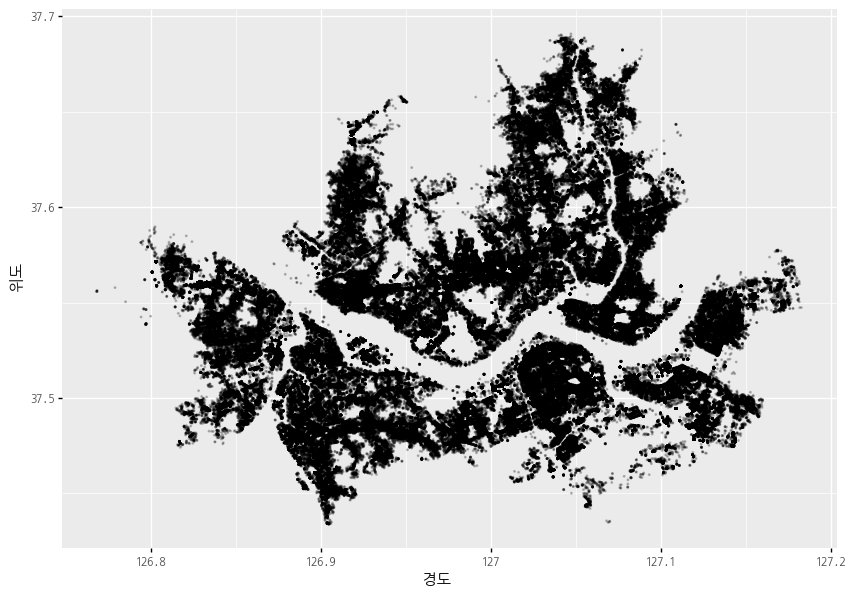

<ggplot: (-9223371922365238503)>

In [20]:
# 서울만 시각화해보면 서울 지도하고 비슷하게 나온다.
(
    ggplot(shop_seoul, aes(x='경도', y='위도'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
)

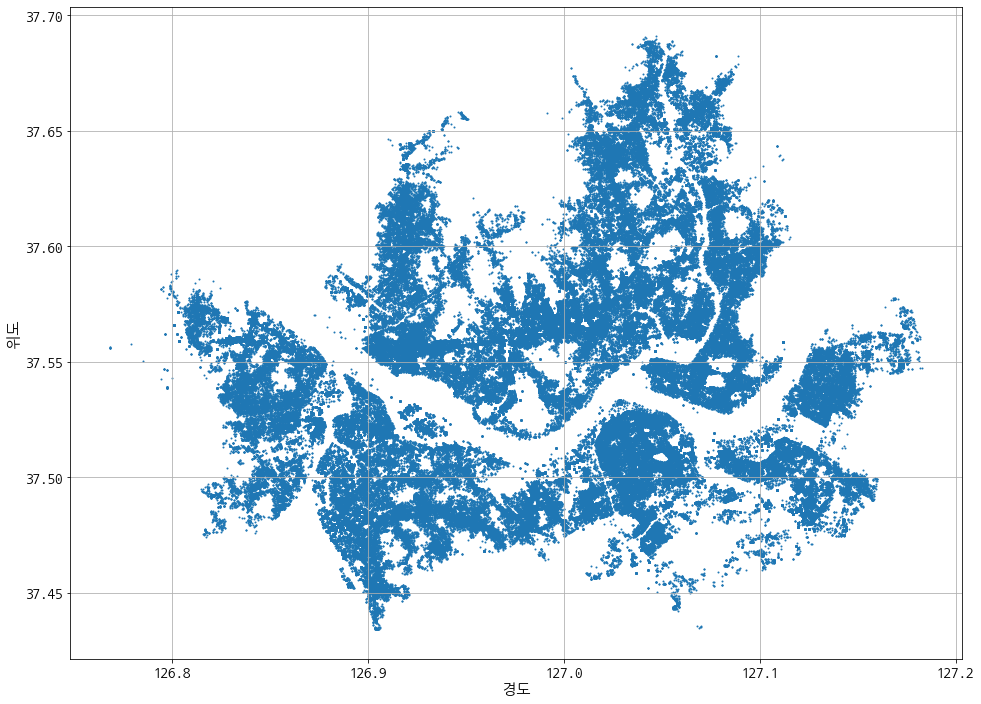

In [21]:
shop_seoul.plot.scatter(x='경도', y='위도', figsize=(16, 12), grid=True, s=1)
plt.show()

shop_202212 데이터프레임의 도로명주소 열을 활용해서 '시도', '구군', '도로명' 열을 만든다.

In [22]:
# split() 메소드에 expand=True 옵션을 지정해서 공백을 경계로 문자열을 서로 다른 열(데이터프레임)로 구분해서
# '시도', '구군', '도로명'열을 만든다.
# print(type(shop_202212[:1].도로명주소)) # <class 'pandas.core.series.Series'>
print(shop_202212[:1].도로명주소)
# print(type(shop_202212[:1].도로명주소.str)) # <class 'pandas.core.strings.StringMethods'>
print(shop_202212[:1].도로명주소.str)
# print(type(shop_202212[:1].도로명주소.str.split(' '))) # <class 'pandas.core.series.Series'>
print(shop_202212[:1].도로명주소.str.split(' '))
print('=' * 80)
print(type(shop_202212[:1].도로명주소.str.split(' ', expand=True)))
print(shop_202212[:1].도로명주소.str.split(' ', expand=True))
print('=' * 80)
print(shop_202212[:1].도로명주소.str.split(' ', expand=True)[0])
print(shop_202212[:1].도로명주소.str.split(' ', expand=True)[1])
print(shop_202212[:1].도로명주소.str.split(' ', expand=True)[2])
print(shop_202212[:1].도로명주소.str.split(' ', expand=True)[3])

0    서울특별시 영등포구 영중로14길 11-17
Name: 도로명주소, dtype: object
0    [서울특별시, 영등포구, 영중로14길, 11-17]
Name: 도로명주소, dtype: object
<class 'pandas.core.frame.DataFrame'>
       0     1       2      3
0  서울특별시  영등포구  영중로14길  11-17
0    서울특별시
Name: 0, dtype: object
0    영등포구
Name: 1, dtype: object
0    영중로14길
Name: 2, dtype: object
0    11-17
Name: 3, dtype: object


In [23]:
shop_202212['시도'] = shop_202212.도로명주소.str.split(' ', expand=True)[0]
shop_202212['구군'] = shop_202212.도로명주소.str.split(' ', expand=True)[1]
shop_202212['도로명'] = shop_202212.도로명주소.str.split(' ', expand=True)[2]
shop_202212

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,서울특별시 영등포구 영중로14길 11-17,126.907168,37.520613,서울특별시,영등포구,영중로14길
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,서울특별시 성동구 용답5길 2,127.049018,37.566857,서울특별시,성동구,용답5길
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,서울특별시 종로구 서순라길 17-10,126.993530,37.571848,서울특별시,종로구,서순라길
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,서울특별시 송파구 위례성대로12길 31,127.121520,37.510967,서울특별시,송파구,위례성대로12길
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,서울특별시 서초구 동광로18길 82,126.991394,37.488375,서울특별시,서초구,동광로18길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
540279,리오마죠레,NaN,생활서비스,이/미용/건강,여성미용실,부산광역시,해운대구,반여1동,반여동,부산광역시 해운대구 반여동 1632,부산광역시 해운대구 반여로 131,129.123373,35.203476,부산광역시,해운대구,반여로
540280,메이미래쉬,NaN,생활서비스,이/미용/건강,비만/피부관리,부산광역시,강서구,녹산동,지사동,부산광역시 강서구 지사동 1190-2,부산광역시 강서구 과학산단로334번다길 60,128.835928,35.149797,부산광역시,강서구,과학산단로334번다길
540281,크라운호프,부산학장점,음식,유흥주점,호프/맥주,부산광역시,사상구,학장동,학장동,부산광역시 사상구 학장동 579-25,부산광역시 사상구 대동로 111,128.979739,35.139354,부산광역시,사상구,대동로
540282,가배원커피,당리점,음식,커피점/카페,커피전문점/카페/다방,부산광역시,사하구,하단1동,하단동,부산광역시 사하구 하단동 623-17,부산광역시 사하구 낙동대로 413,128.973045,35.103424,부산광역시,사하구,낙동대로


In [24]:
# '시도', '구군', '도로명' 열이 추가된 원본 데이터프레임(shop_202212)에서 서울만 다시 추출한다.
shop_seoul = shop_202212[shop_202212.시도명.str.startswith('서울')]
shop_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
0,제중건강원,NaN,소매,건강/미용식품,건강원,서울특별시,영등포구,영등포동,영등포동5가,서울특별시 영등포구 영등포동5가 41-1,서울특별시 영등포구 영중로14길 11-17,126.907168,37.520613,서울특별시,영등포구,영중로14길
1,민속악기사,NaN,소매,취미/오락관련소매,악기판매,서울특별시,성동구,용답동,용답동,서울특별시 성동구 용답동 142-11,서울특별시 성동구 용답5길 2,127.049018,37.566857,서울특별시,성동구,용답5길
2,태평양진주,NaN,소매,시계/귀금속소매,시계/귀금속,서울특별시,종로구,종로1.2.3.4가동,봉익동,서울특별시 종로구 봉익동 43-1,서울특별시 종로구 서순라길 17-10,126.993530,37.571848,서울특별시,종로구,서순라길
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,서울특별시 송파구 위례성대로12길 31,127.121520,37.510967,서울특별시,송파구,위례성대로12길
4,비지트,NaN,음식,한식,한식/백반/한정식,서울특별시,서초구,방배4동,방배동,서울특별시 서초구 방배동 854-18,서울특별시 서초구 동광로18길 82,126.991394,37.488375,서울특별시,서초구,동광로18길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377719,향나무참숯장어나라,NaN,음식,한식,한식/백반/한정식,서울특별시,은평구,대조동,대조동,서울특별시 은평구 대조동 26-8,서울특별시 은평구 진흥로 153-4,126.926643,37.609327,서울특별시,은평구,진흥로
377720,에이치에스컨설팅,NaN,부동산,부동산중개,부동산중개,서울특별시,도봉구,방학1동,방학동,서울특별시 도봉구 방학동 696-40,서울특별시 도봉구 방학로6길 38,127.036563,37.664572,서울특별시,도봉구,방학로6길
377721,크린에이드,가양역점,생활서비스,세탁/가사서비스,세탁소/빨래방,서울특별시,강서구,가양2동,가양동,서울특별시 강서구 가양동 14-3,서울특별시 강서구 양천로 489,126.854188,37.562234,서울특별시,강서구,양천로
377722,멍,NaN,소매,애견/애완/동물,애완동물 미용실,서울특별시,도봉구,창2동,창동,서울특별시 도봉구 창동 581-12,서울특별시 도봉구 덕릉로59길 15,127.038608,37.640459,서울특별시,도봉구,덕릉로59길


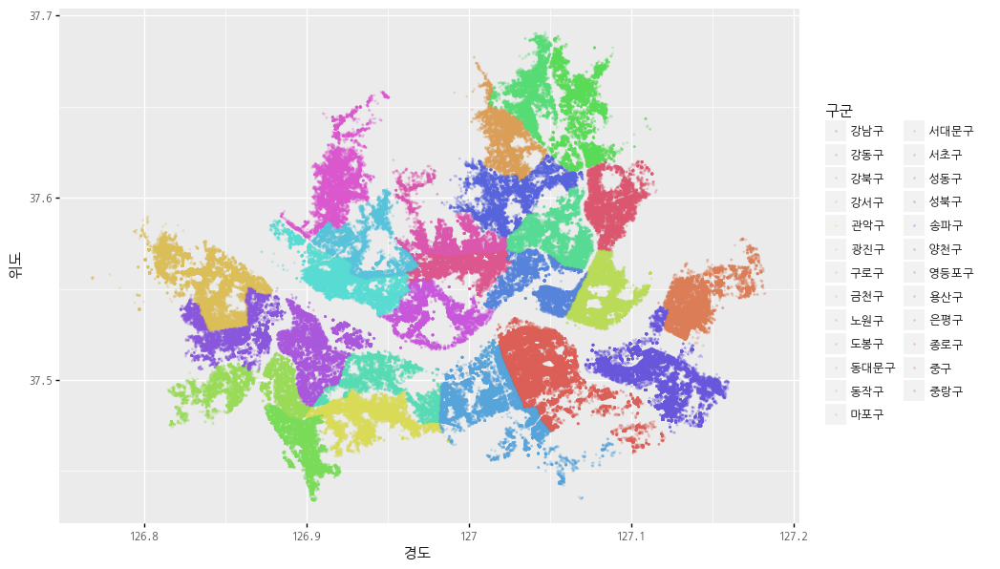

<ggplot: (114491820815)>

In [25]:
(
    ggplot(shop_seoul, aes(x='경도', y='위도', color='구군'))
        + geom_point(size=0.2, alpha=0.2)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
)

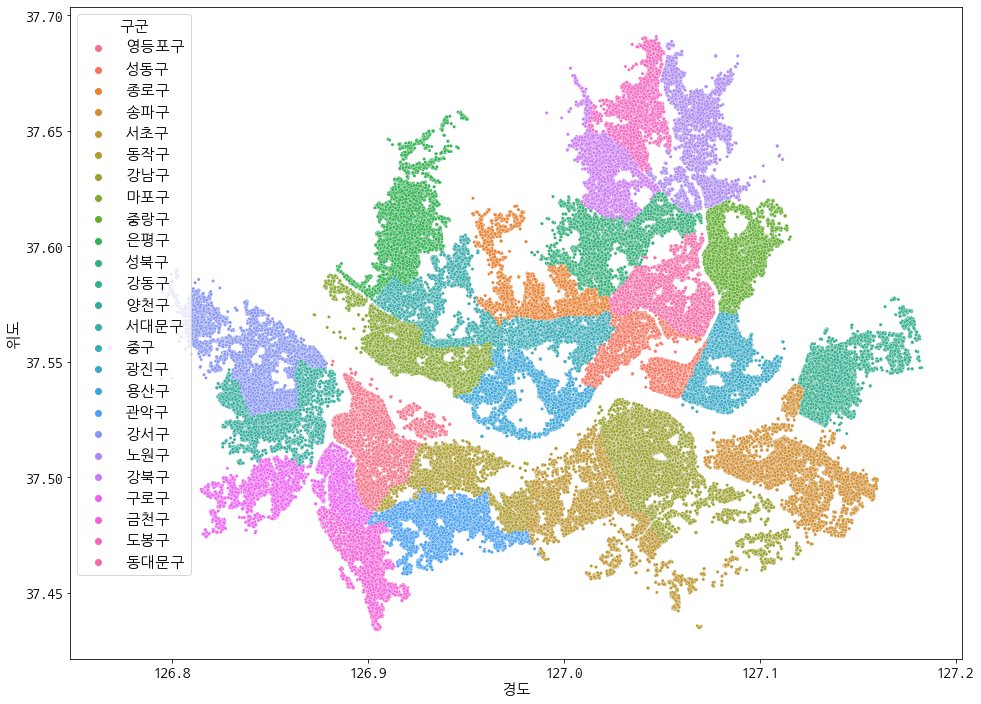

In [26]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul, x='경도', y='위도', hue='구군', s=10)
plt.show()

In [27]:
set(shop_seoul.상권업종대분류명)

{'관광/여가/오락', '부동산', '생활서비스', '소매', '숙박', '스포츠', '음식', '학문/교육'}

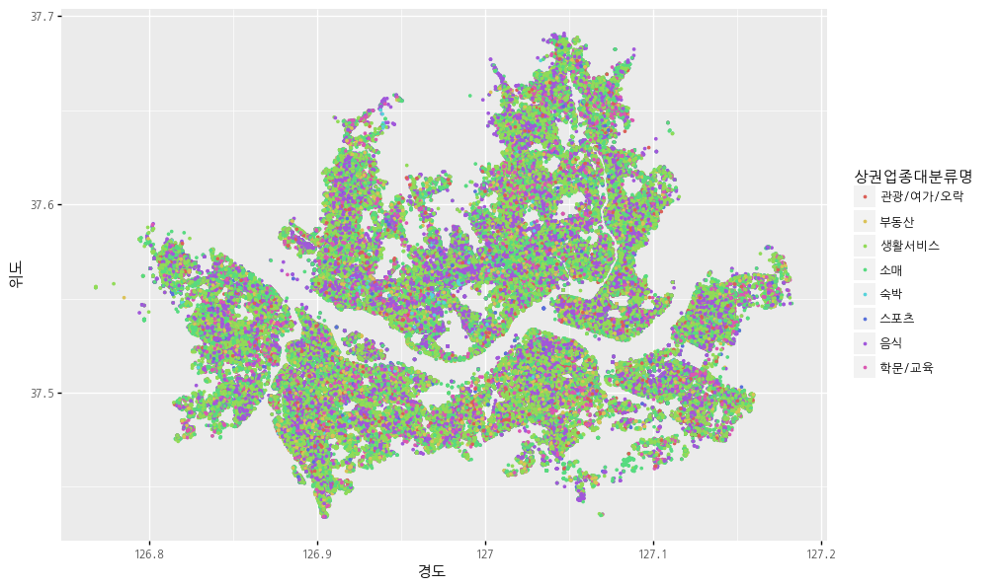

<ggplot: (-9223371922364859560)>

In [28]:
(
    ggplot(shop_seoul, aes(x='경도', y='위도', color='상권업종대분류명'))
        + geom_point(size=0.5)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

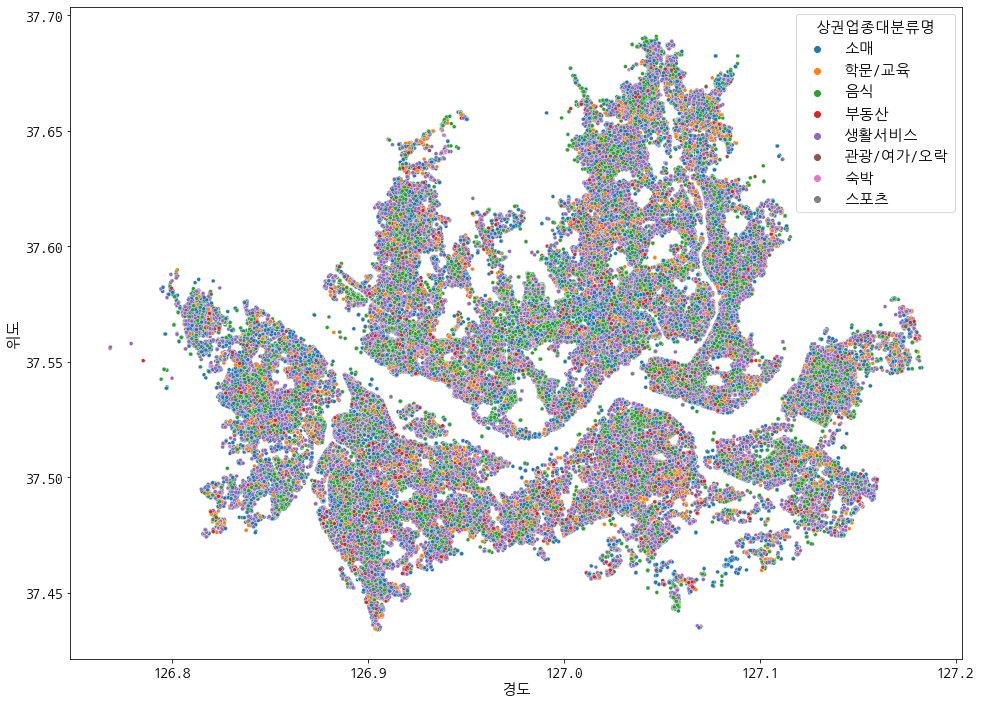

In [29]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul, x='경도', y='위도', hue='상권업종대분류명', s=15)
plt.show()

학문/교육과 관련된 정보 보기

In [30]:
shop_seoul_edu = shop_seoul[shop_seoul.상권업종대분류명 == '학문/교육']
shop_seoul_edu

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
3,김선희꼼꼼국어교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 197-3,서울특별시 송파구 위례성대로12길 31,127.121520,37.510967,서울특별시,송파구,위례성대로12길
8,무비디자인,NaN,학문/교육,학원-창업취업취미,학원-디자인,서울특별시,마포구,대흥동,노고산동,서울특별시 마포구 노고산동 107-17,서울특별시 마포구 백범로 8,126.936717,37.553996,서울특별시,마포구,백범로
18,힐리빙텔,NaN,학문/교육,도서관/독서실,독서실,서울특별시,서대문구,신촌동,대현동,서울특별시 서대문구 대현동 37-69,서울특별시 서대문구 이화여대5길 28,126.944057,37.558414,서울특별시,서대문구,이화여대5길
19,김샘수학교습소,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,중구,신당5동,신당동,서울특별시 중구 신당동 851,서울특별시 중구 퇴계로90길 74,127.020965,37.560996,서울특별시,중구,퇴계로90길
43,노바수학학원,NaN,학문/교육,학원-보습교습입시,학원-입시,서울특별시,강남구,일원2동,개포동,서울특별시 강남구 개포동 12-4,서울특별시 강남구 개포로 615,127.075573,37.492649,서울특별시,강남구,개포로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377616,젬마에듀케이션,NaN,학문/교육,학원기타,학원(종합),서울특별시,노원구,월계3동,월계동,서울특별시 노원구 월계동 18,서울특별시 노원구 마들로 31,127.068175,37.617387,서울특별시,노원구,마들로
377619,헤어앤에스엠피,NaN,학문/교육,학원-어학,학원-외국어/어학,서울특별시,동대문구,장안2동,장안동,서울특별시 동대문구 장안동 302-1,서울특별시 동대문구 장한로 181,127.071751,37.576634,서울특별시,동대문구,장한로
377635,학원,꿈의숲음악,학문/교육,학원-음악미술무용,피아노/바이올린/기타,서울특별시,강북구,번3동,번동,서울특별시 강북구 번동 308-3,서울특별시 강북구 오현로34길 12,127.040018,37.628595,서울특별시,강북구,오현로34길
377641,트레저애드,NaN,학문/교육,학원-예능취미체육,레크레이션지도/상담,서울특별시,종로구,무악동,무악동,서울특별시 종로구 무악동 82,서울특별시 종로구 통일로 246-20,126.962054,37.577072,서울특별시,종로구,통일로


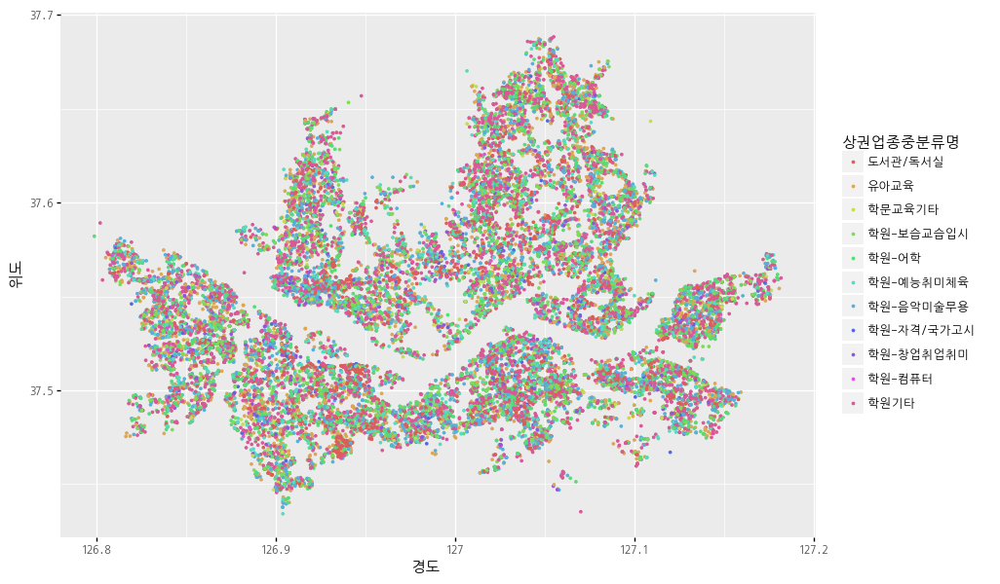

<ggplot: (-9223371922334623516)>

In [31]:
(
    ggplot(shop_seoul_edu, aes(x='경도', y='위도', color='상권업종중분류명'))
        + geom_point(size=0.5)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

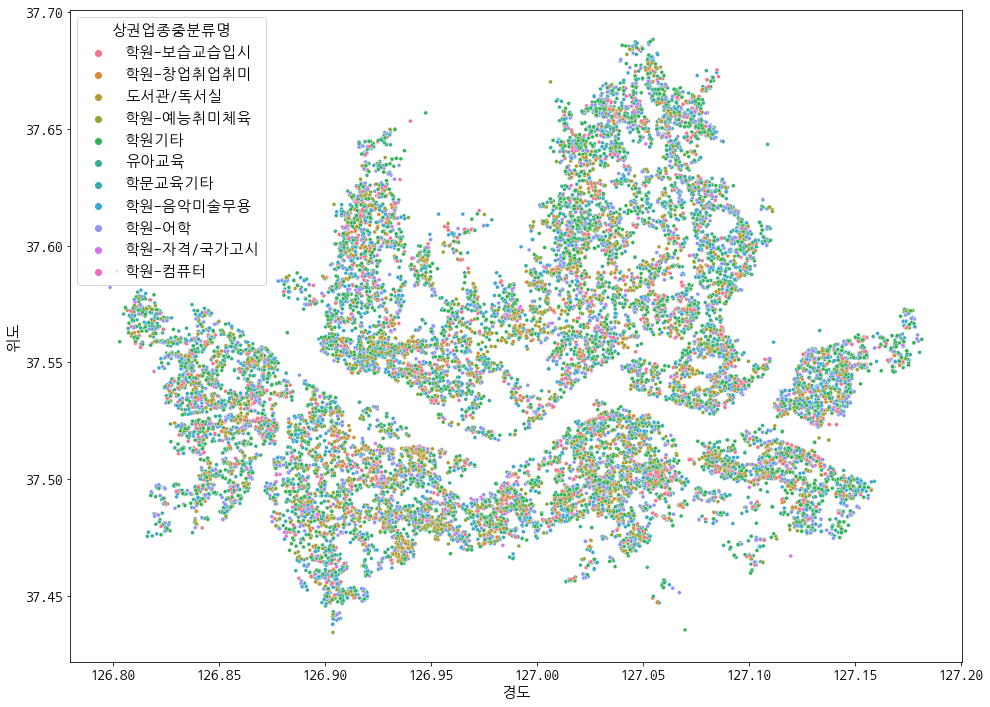

In [32]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_edu, x='경도', y='위도', hue='상권업종중분류명', s=15)
plt.show()

부동산과 관련된 정보 보기

In [33]:
shop_seoul_realty = shop_seoul[shop_seoul.상권업종대분류명 == '부동산']
shop_seoul_realty

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
10,연세공인중개사사무소,NaN,부동산,부동산중개,부동산중개,서울특별시,은평구,역촌동,역촌동,서울특별시 은평구 역촌동 17-15,서울특별시 은평구 진흥로 101,126.922332,37.605891,서울특별시,은평구,진흥로
33,미래공인중개사,NaN,부동산,부동산중개,부동산중개,서울특별시,송파구,오금동,오금동,서울특별시 송파구 오금동 43,서울특별시 송파구 오금로35길 17,127.127342,37.506388,서울특별시,송파구,오금로35길
36,대성부동산,NaN,부동산,부동산중개,부동산중개,서울특별시,용산구,이촌2동,이촌동,서울특별시 용산구 이촌동 203-61,서울특별시 용산구 이촌로22길 20,126.955577,37.525295,서울특별시,용산구,이촌로22길
47,럭키공인,NaN,부동산,부동산중개,부동산중개,서울특별시,강남구,도곡1동,도곡동,서울특별시 강남구 도곡동 959-3,서울특별시 강남구 남부순환로359길 34,127.035670,37.487032,서울특별시,강남구,남부순환로359길
58,행복공인중개사무소,NaN,부동산,부동산중개,부동산중개,서울특별시,강동구,성내1동,성내동,서울특별시 강동구 성내동 465,서울특별시 강동구 성내로14길 27,127.126609,37.526602,서울특별시,강동구,성내로14길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377666,헤스티아에이블,NaN,부동산,분양,건물분양-종합,서울특별시,은평구,진관동,진관동,서울특별시 은평구 진관동 100-1,서울특별시 은평구 통일로 1022,126.917726,37.633790,서울특별시,은평구,통일로
377673,아르스헥사프리포트인천공항피에프브이,NaN,부동산,분양,건물분양-종합,서울특별시,강남구,청담동,청담동,서울특별시 강남구 청담동 129-3,서울특별시 강남구 도산대로 549,127.053931,37.525637,서울특별시,강남구,도산대로
377677,수건축,NaN,부동산,분양,주택공급,서울특별시,노원구,상계1동,상계동,서울특별시 노원구 상계동 1098-21,서울특별시 노원구 동일로239나길 36,127.051699,37.676688,서울특별시,노원구,동일로239나길
377715,바른가족경매,NaN,부동산,분양,건물분양-종합,서울특별시,금천구,가산동,가산동,서울특별시 금천구 가산동 371-28,서울특별시 금천구 가산디지털1로 168,126.882626,37.479953,서울특별시,금천구,가산디지털1로


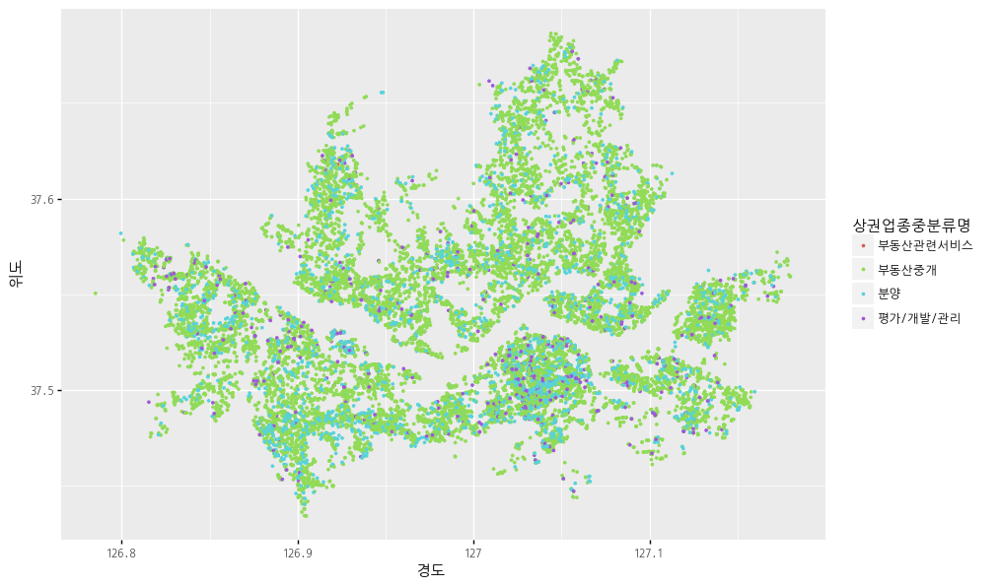

<ggplot: (-9223371922277279302)>

In [34]:
(
    ggplot(shop_seoul_realty, aes(x='경도', y='위도', color='상권업종중분류명'))
        + geom_point(size=0.5)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

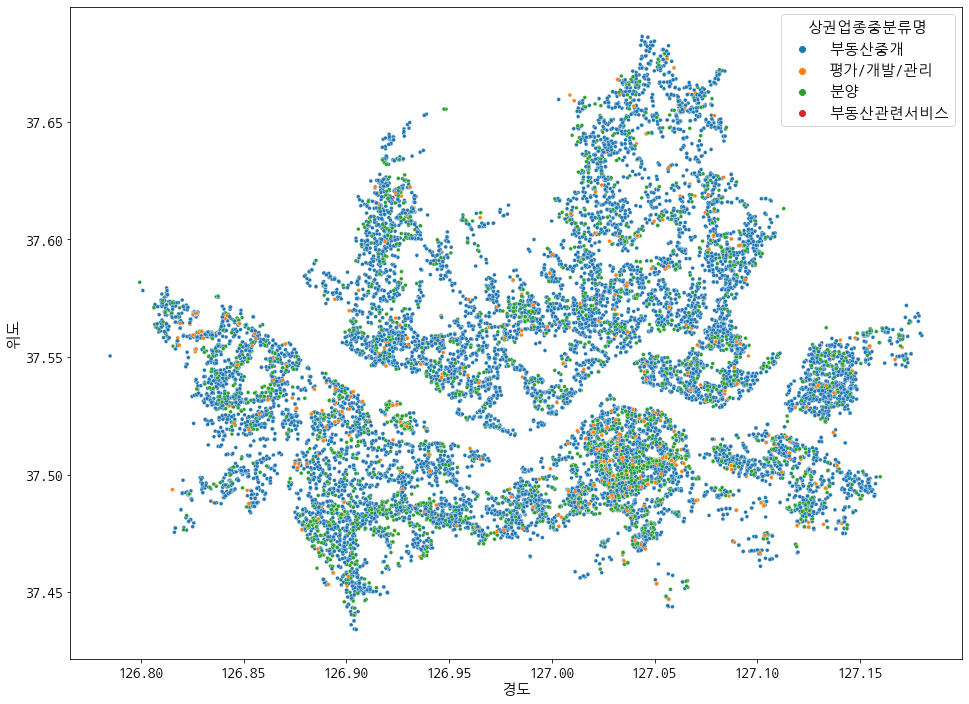

In [35]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_realty, x='경도', y='위도', hue='상권업종중분류명', s=15)
plt.show()

컴퓨터 학원과 관련된 정보 보기

In [36]:
set(shop_seoul_edu.상권업종중분류명)

{'도서관/독서실',
 '유아교육',
 '학문교육기타',
 '학원-보습교습입시',
 '학원-어학',
 '학원-예능취미체육',
 '학원-음악미술무용',
 '학원-자격/국가고시',
 '학원-창업취업취미',
 '학원-컴퓨터',
 '학원기타'}

In [37]:
shop_seoul_edu_computer = shop_seoul_edu[shop_seoul_edu.상권업종중분류명 == '학원-컴퓨터']
shop_seoul_edu_computer

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
4920,진원컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 28-6,서울특별시 양천구 화곡로 41,126.826484,37.539544,서울특별시,양천구,화곡로
5707,대성컴퓨터회계학원,대성컴퓨터회계,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,관악구,인헌동,봉천동,서울특별시 관악구 봉천동 1657-24,서울특별시 관악구 남부순환로 1952,126.965659,37.475943,서울특별시,관악구,남부순환로
7137,구로컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,금천구,시흥1동,시흥동,서울특별시 금천구 시흥동 870-10,서울특별시 금천구 시흥대로 266,126.899903,37.457508,서울특별시,금천구,시흥대로
13961,아몬정보컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,중랑구,중화1동,중화동,서울특별시 중랑구 중화동 290-5,서울특별시 중랑구 동일로130길 39,127.082118,37.599980,서울특별시,중랑구,동일로130길
15541,구미컴퓨터학원,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 816-3,서울특별시 강남구 강남대로 416,127.027137,37.499793,서울특별시,강남구,강남대로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349153,학원,잼코딩서초,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,서초구,서초1동,서초동,서울특별시 서초구 서초동 1603-9,서울특별시 서초구 서초중앙로 40-6,127.016443,37.485648,서울특별시,서초구,서초중앙로
353408,메타코딩컴퓨터교습소,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,양천구,신월4동,신월동,서울특별시 양천구 신월동 439-16,서울특별시 양천구 오목로 19,126.839661,37.521645,서울특별시,양천구,오목로
354865,네오락,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,서초구,반포1동,반포동,서울특별시 서초구 반포동 745,서울특별시 서초구 사평대로 335,127.019591,37.503452,서울특별시,서초구,사평대로
367284,휴몬랩코딩아카데미,NaN,학문/교육,학원-컴퓨터,컴퓨터학원,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 신사동 609-6,서울특별시 강남구 압구정로32길 24,127.029759,37.526171,서울특별시,강남구,압구정로32길


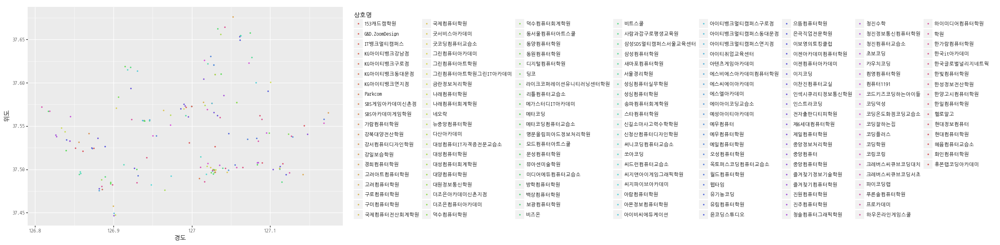

<ggplot: (114546095266)>

In [38]:
(
    ggplot(shop_seoul_edu_computer, aes(x='경도', y='위도', color='상호명'))
        + geom_point(size=0.5)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

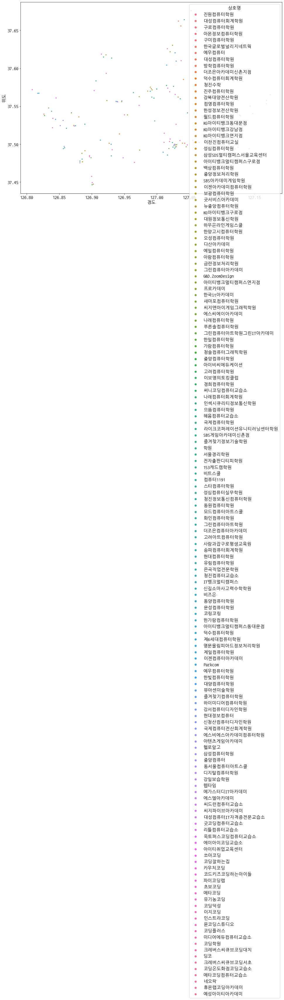

In [39]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_edu_computer, x='경도', y='위도', hue='상호명', s=15)
plt.show()

folium Map 컴퓨터 학원 위치 시각화

In [40]:
import folium

In [50]:
data = shop_seoul_edu_computer
edu_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12, tiles='Stamen Terrain')

'''
# iterrows() 메소드는 index와 데이터를 튜플 형태로 리턴한다.
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.Marker(location=[edu.위도, edu.경도], popup=popup).add_to(edu_map)
'''

for i in data.index:
    popup = folium.Popup('{}: {}'.format(data.loc[i, '상호명'], data.loc[i, '도로명주소']), max_width=300)
    folium.Marker(location=[data.loc[i, '위도'], data.loc[i, '경도']], popup=popup).add_to(edu_map)

edu_map.save('./output/edu_map.html')
edu_map

커피점/카페 시각화

In [51]:
set(shop_seoul.상권업종중분류명)

{'PC/오락/당구/볼링등',
 '가구소매',
 '가방/신발/액세서리',
 '가전제품소매',
 '가정/주방/인테리어',
 '개인/가정용품수리',
 '개인서비스',
 '건강/미용식품',
 '경마/경륜/성인오락',
 '광고/인쇄',
 '기타서비스업',
 '기타음식업',
 '기타판매업',
 '놀이/여가/취미',
 '닭/오리요리',
 '대중목욕탕/휴게',
 '대행업',
 '도서관/독서실',
 '모텔/여관/여인숙',
 '무도/유흥/가무',
 '물품기기대여',
 '민박/하숙',
 '법무세무회계',
 '별식/퓨전요리',
 '부동산관련서비스',
 '부동산중개',
 '부페',
 '분식',
 '분양',
 '사무/문구/컴퓨터',
 '사진',
 '사진/광학/정밀기기소매',
 '선물/팬시/기념품',
 '세탁/가사서비스',
 '스포츠/운동',
 '시계/귀금속소매',
 '실내운동시설',
 '실외운동시설',
 '애견/애완/동물',
 '양식',
 '연극/영화/극장',
 '예술품/골동품/수석/분재',
 '예식/의례/관혼상제',
 '요가/단전/마사지',
 '운동/경기용품소매',
 '운송/배달/택배',
 '운영관리시설',
 '유스호스텔',
 '유아교육',
 '유아용품',
 '유흥주점',
 '음/식료품소매',
 '음식배달서비스',
 '의복의류',
 '의약/의료품소매',
 '이/미용/건강',
 '인력/고용/용역알선',
 '일식/수산물',
 '자동차/이륜차',
 '자동차/자동차용품',
 '장례/묘지',
 '제과제빵떡케익',
 '종교용품판매',
 '종합소매점',
 '주유소/충전소',
 '주택수리',
 '중고품소매/교환',
 '중식',
 '책/서적/도서',
 '철물/난방/건설자재소매',
 '취미/오락관련소매',
 '캠프/별장/펜션',
 '커피점/카페',
 '패스트푸드',
 '페인트/유리제품소매',
 '평가/개발/관리',
 '학문교육기타',
 '학원-보습교습입시',
 '학원-어학',
 '학원-예능취미체육',
 '학원-음악미술무용',
 '학원-자격/국가고시',
 '학원-창업취업취미',
 '학원-컴퓨터',
 

In [52]:
shop_seoul_cafe = shop_seoul[shop_seoul.상권업종중분류명 == '커피점/카페']
shop_seoul_cafe

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
20,커피빈,코리아대학로대명거리점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,종로구,혜화동,명륜4가,서울특별시 종로구 명륜4가 51,서울특별시 종로구 대명길 25,127.000171,37.583149,서울특별시,종로구,대명길
96,요거프레소,쌍문점,음식,커피점/카페,커피전문점/카페/다방,서울특별시,도봉구,쌍문2동,쌍문동,서울특별시 도봉구 쌍문동 20,서울특별시 도봉구 도당로 7,127.034746,37.658728,서울특별시,도봉구,도당로
189,우성커피숍,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,양천구,신월4동,신월동,서울특별시 양천구 신월동 514-2,서울특별시 양천구 오목로 48,126.842935,37.522055,서울특별시,양천구,오목로
196,버블베어,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강서구,방화3동,방화동,서울특별시 강서구 방화동 819,서울특별시 강서구 금낭화로 167,126.813358,37.580941,서울특별시,강서구,금낭화로
232,알뤼르,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,대치4동,대치동,서울특별시 강남구 대치동 894,서울특별시 강남구 삼성로85길 33,127.054731,37.504378,서울특별시,강남구,삼성로85길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377682,힐리HILLI,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,서초구,잠원동,잠원동,서울특별시 서초구 잠원동 61-7,서울특별시 서초구 잠원로4길 41-3,127.010938,37.512931,서울특별시,서초구,잠원로4길
377693,월성맨션,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,마포구,상암동,상암동,서울특별시 마포구 상암동 1607,서울특별시 마포구 상암산로 76,126.892296,37.579186,서울특별시,마포구,상암산로
377701,덩키카페,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강남구,삼성2동,삼성동,서울특별시 강남구 삼성동 141,서울특별시 강남구 선릉로 514,127.049151,37.505595,서울특별시,강남구,선릉로
377703,감화커피,NaN,음식,커피점/카페,커피전문점/카페/다방,서울특별시,강서구,화곡8동,화곡동,서울특별시 강서구 화곡동 333-27,서울특별시 강서구 강서로18가길 44,126.846106,37.535791,서울특별시,강서구,강서로18가길


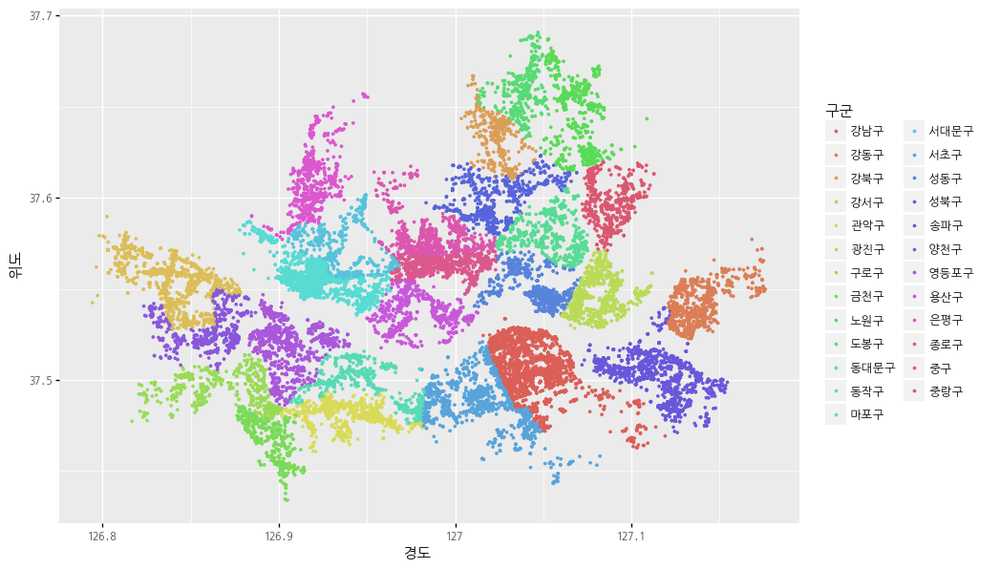

<ggplot: (114549668023)>

In [53]:
(
    ggplot(shop_seoul_cafe, aes(x='경도', y='위도', color='구군'))
        + geom_point(size=0.5)
        + theme(text=element_text(family='NanumGothicCoding'), figure_size=(10, 7))
        + scale_fill_gradient(low='blue', high='green')
)

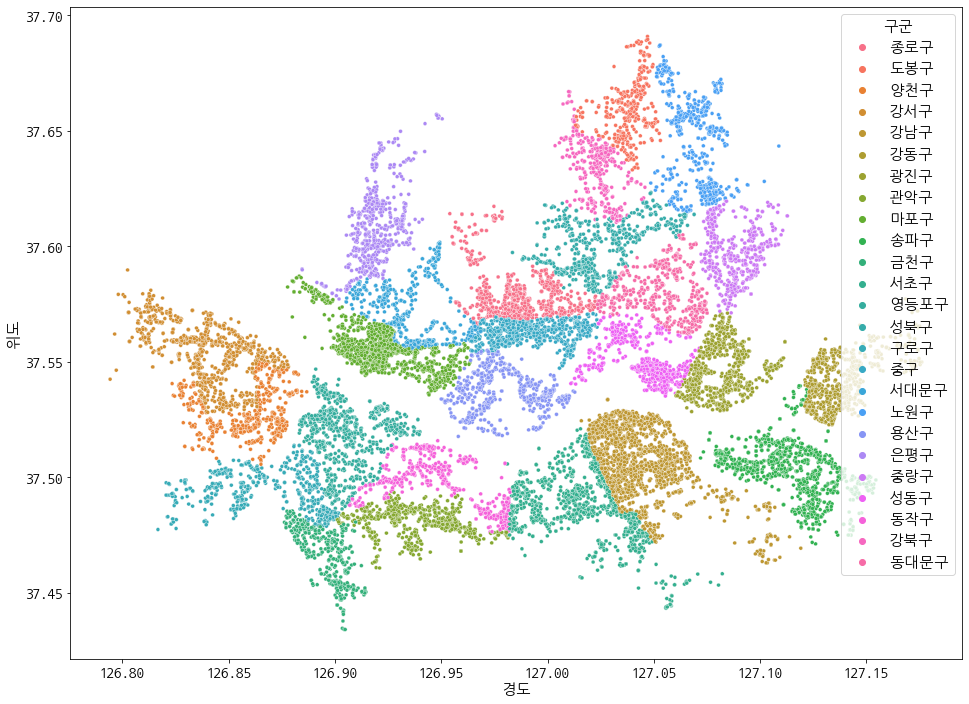

In [54]:
plt.figure(figsize=(16, 12))
sns.scatterplot(data=shop_seoul_cafe, x='경도', y='위도', hue='구군', s=15)
plt.show()

이디야, 스타벅스 시각화

In [73]:
data = shop_seoul_cafe[shop_seoul_cafe.상호명.str.find('이디야') >= 0]
cafe_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12)
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='blue').add_to(cafe_map)

data = shop_seoul_cafe[shop_seoul_cafe.상호명.str.find('스타벅스') >= 0]
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='red').add_to(cafe_map)

cafe_map.save('./output/cafe_map.html')
cafe_map

베스킨라빈스, 던킨도너츠 시각화

In [75]:
data = shop_seoul[shop_seoul.상호명.str.find('스킨라빈스') >= 0]
cafe_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12)
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul.상호명.str.find('던킨') >= 0]
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='red').add_to(cafe_map)

cafe_map.save('./output/cafe_map.html')
cafe_map

파리바게뜨, 뚜레쥬르

In [76]:
data = shop_seoul[shop_seoul.상호명.str.find('파리바게뜨') >= 0]
cafe_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12)
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul.상호명.str.find('뚜레쥬르') >= 0]
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='red').add_to(cafe_map)

cafe_map.save('./output/cafe_map.html')
cafe_map

빽다방, 메가커피

In [78]:
data = shop_seoul[shop_seoul.상호명.str.find('빽다방') >= 0]
cafe_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12)
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='blue').add_to(cafe_map)

data = shop_seoul[shop_seoul.상호명.str.find('메가커피') >= 0]
for _, edu in data.iterrows():
    popup = folium.Popup('{}: {}'.format(edu.상호명, edu.도로명주소), max_width=300)
    folium.CircleMarker(location=[edu.위도, edu.경도], popup=popup, radius=2, color='red').add_to(cafe_map)

cafe_map.save('./output/cafe_map.html')
cafe_map

구군별 커피점/카페수 시각화

In [85]:
shop_seoul_cafe_count = shop_seoul_cafe.groupby('구군').상호명.count()
shop_seoul_cafe_count.head()

구군
강남구    2262
강동구     786
강북구     395
강서구    1157
관악구     755
Name: 상호명, dtype: int64

In [88]:
shop_seoul_cafe_lat = shop_seoul_cafe.groupby('구군').위도.mean()
shop_seoul_cafe_lat.head()

구군
강남구    37.506266
강동구    37.542181
강북구    37.632614
강서구    37.555494
관악구    37.480558
Name: 위도, dtype: float64

In [89]:
shop_seoul_cafe_lot = shop_seoul_cafe.groupby('구군').경도.mean()
shop_seoul_cafe_lot.head()

구군
강남구    127.044577
강동구    127.139299
강북구    127.023387
강서구    126.838198
관악구    126.939574
Name: 경도, dtype: float64

In [93]:
shop_seoul_cafe_concat = pd.concat([shop_seoul_cafe_count, shop_seoul_cafe_lat, shop_seoul_cafe_lot], axis=1)
shop_seoul_cafe_concat.columns = ['매장수', '위도', '경도']
shop_seoul_cafe_concat

,매장수,위도,경도
구군,,,
강남구,2262,37.506266,127.044577
강동구,786,37.542181,127.139299
강북구,395,37.632614,127.023387
강서구,1157,37.555494,126.838198
관악구,755,37.480558,126.939574
광진구,866,37.546073,127.081245
구로구,609,37.494695,126.870924
금천구,523,37.468778,126.892863
노원구,634,37.644810,127.069257


In [103]:
data = shop_seoul_cafe_concat
cafe_map = folium.Map(location=[data.위도.mean(), data.경도.mean()], zoom_start=12)

for index, cafe in data.iterrows():
    popup = folium.Popup('{}: {:,.0f}'.format(index, cafe.매장수), max_width=300)
    folium.CircleMarker(location=[cafe.위도, cafe.경도], popup=popup, radius=cafe.매장수 / 40, 
                        color='red',fill_color='blue').add_to(cafe_map)

cafe_map.save('./output/cafe_map.html')
cafe_map